# Preprocessing

Preprocessing starts  upon importing the files!  Recall our previous result.  Now, let's go through and apply basic preprocessing, starting with filtering:
#NOTE: Normally, we'd filter right after import, we are doing it this way merely to visualize the progress of processing steps

Extracting EDF parameters from r:\FINAL_EDF_REPO\EDF_analysis\EDF+\254362\254362.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 143999  =      0.000 ...  1124.992 secs...
Lets compare with and without dc removed:
Using matplotlib as 2D backend.


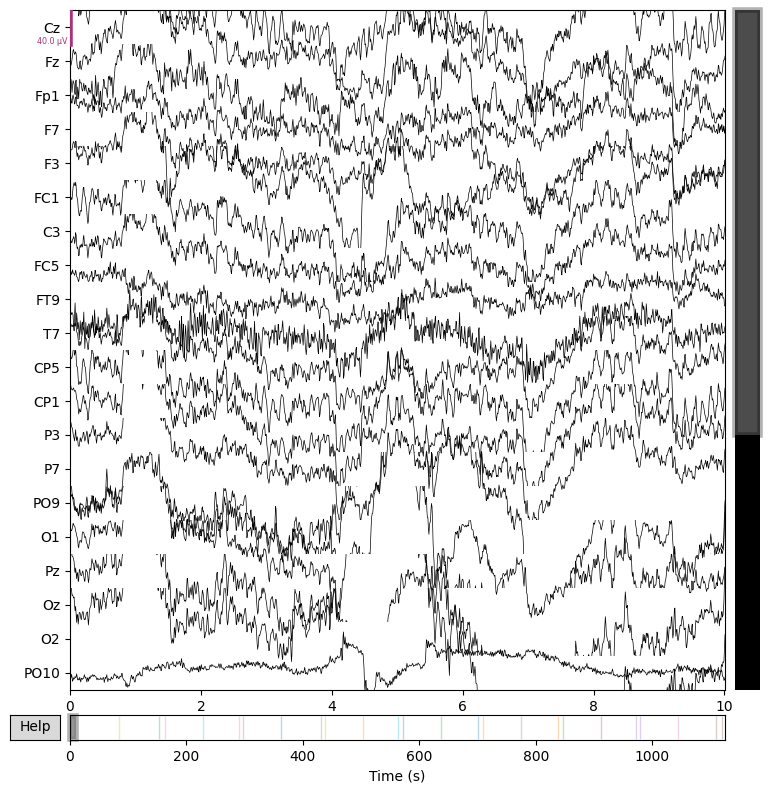

DC removed:


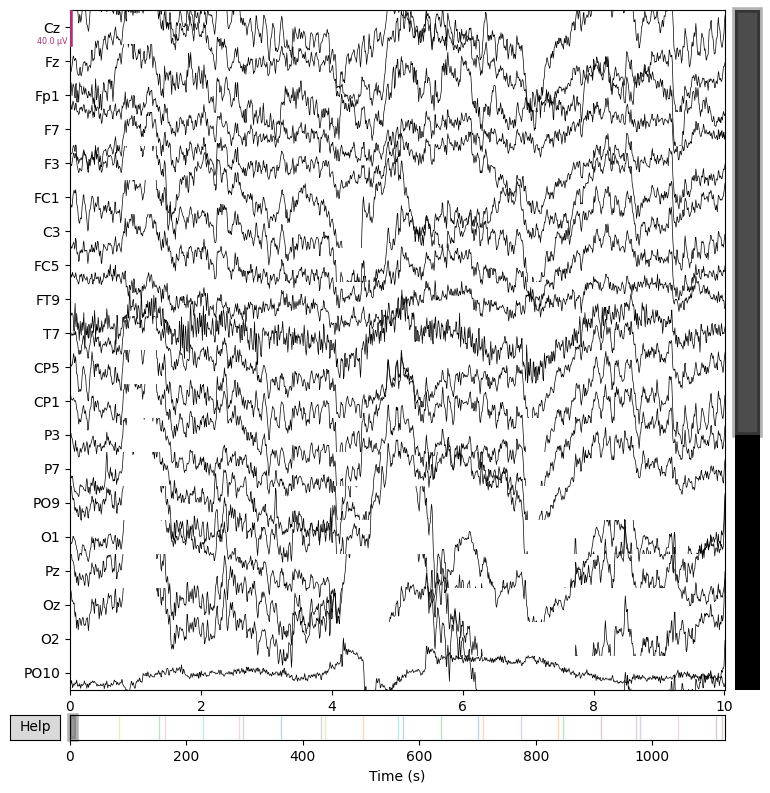

Notice that removing the DC drifts
 makes more data fit on the graph!
(depending on what is graphed)

Let's filter the raw so that we can see how much it improves the signal!
Filtering a subset of channels. The highpass and lowpass values in the measurement info will not be updated.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 423 samples (3.305 s)



C:\Users\Admin\AppData\Local\Temp\ipykernel_13548\2803047369.py:39: RuntimeWarning: joblib not installed. Cannot run in parallel.
  filtered = raw.copy().filter(


Now plotting filtered data:


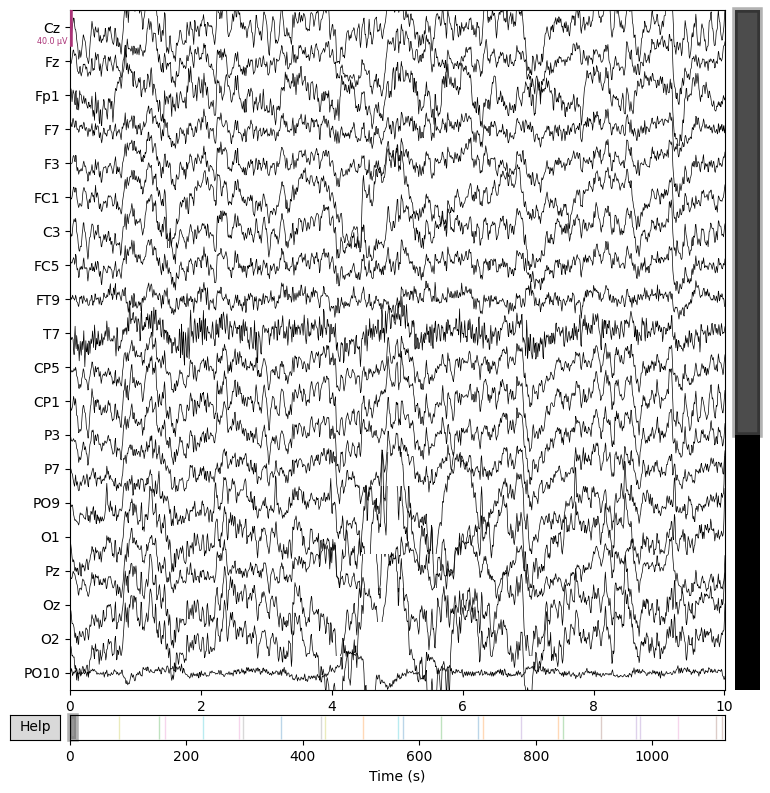

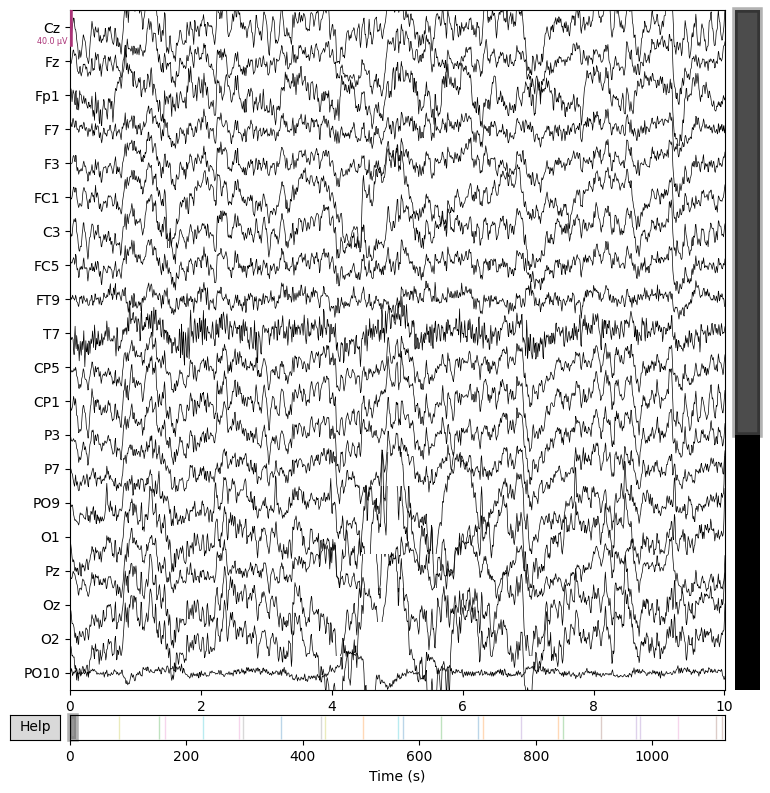

In [1]:
import mne
from mne.preprocessing import ICA  # Import it explicitly to minimize required code and refer to it more easily
muscle_threshold = 0.6 #0.5
eog_threshold = 4 #3

## Definitions:

# Define eeg channels for when we need to pass them explicitly as arguments
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
eog_channels=['Fp1', 'Fp2']

# Create a raw object.  A raw object is the data exactly as exported from emotiv.  It will have methods available for processing
raw = mne.io.read_raw_edf(
    r'EDF+\254362\254362.edf', # What file?
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2 for a future experiment ##NOTE: YOU MUST watch the capitalization!
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    # exclude=[],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )

# Here we will set attributes of the object for it to recognize electrode position from our data for plotting and location based needs
montage = mne.channels.make_standard_montage('standard_1020') #Our data is in standard 1020 format from emotiv
raw.set_montage(montage, on_missing='ignore') #Our "missing" electrodes are ones that are in the 1020 layout, but not in our 32 channels.  
raw.pick('eeg') # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want later

print('Lets compare with and without dc removed:')
raw.pick('eeg').plot(picks=eeg_channels, title = 'Raw Data',block=True, remove_dc=False) #NOTE: Please see all options in documentation, ommited here to keep it simple!  Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
print('DC removed:')
raw.pick('eeg').plot(picks=eeg_channels, title = 'Raw Data',block=True, remove_dc=True)
print('Notice that removing the DC drifts\n makes more data fit on the graph!\n(depending on what is graphed)\n')
## OPTIONAL: Plot original raw again for re-comparison
    # raw.pick('eeg').plot(picks=eeg_channels, title = 'Raw Data',block=True) # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
print("Let's filter the raw so that we can see how much it improves the signal!")

#Filtering options
filtered = raw.copy().filter(
            l_freq=1, #NOTE: This is a key value to experiment with!
            h_freq=40, #The high frequency cut off
            picks=eeg_channels, #Explicitly pass the channels so it doesn't try and filter contact quality, for example
            n_jobs = 4, #The more, the faster the processing            
            ) # Apply bandpass filter

# Plot filtered
print('Now plotting filtered data:')
filtered.pick('eeg').plot(picks=eeg_channels, title = 'Filtered Data',block=True) # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want

We can see a profound difference even with simple filtering!
Now, we can try a simple case of performing independent component analysis
on the overall data.  

C:\Users\Admin\AppData\Local\Temp\ipykernel_13548\3257113383.py:12: RuntimeWarning: The data has not been high-pass filtered. For good ICA performance, it should be high-pass filtered (e.g., with a 1.0 Hz lower bound) before fitting ICA.
  ica.fit(


Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 11 ICA components
    Projecting back using 32 PCA components


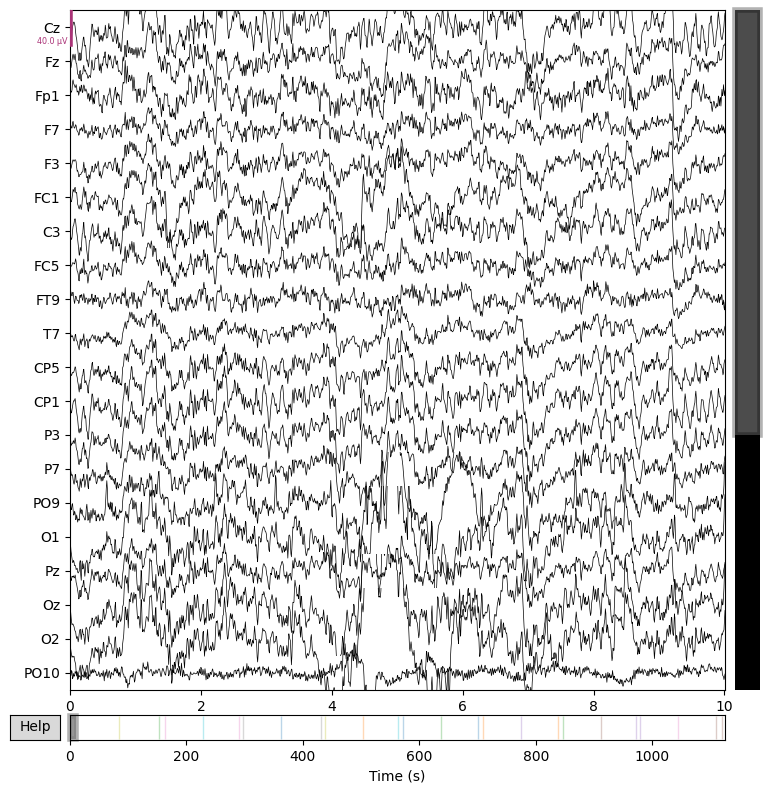

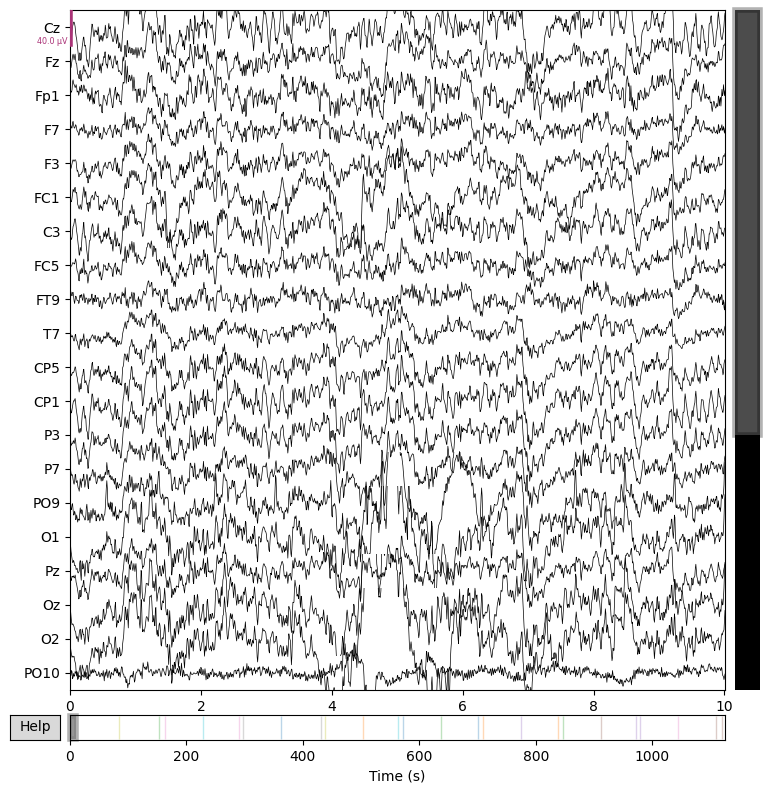

In [3]:
ica = ICA(
    # n_components=32, # Some warnings indicate we need to use less than 31, or a float of 0.9999
    n_components=30, # Some warnings indicate we need to use less than 31, or a float of 0.9999
    #noise_cov =  # This is handled automatically by default
    #method = # This is handled automatically by default
    # fit_params = # This is handled automatically by default
    random_state=97,
    # max_iter=1200, # This is auto by default
    max_iter="auto", #This is the default
    )

ica.fit(
    inst = filtered,
    picks = eeg_channels,
    # start =,
    # stop =,
    # decim =, #NOTE: Experiment with this!
    # reject =,
    # flat =, #NOTE: This is usually used for auto reject, or defining bad data more, but, please experiment with in future
    tstep = 2,# 2 by default NOTE: Experiment with this 
    # reject_by_annotation = True,
    verbose = False,
    )


# Find EOG artifacts
eog_indices, eog_scores = ica.find_bads_eog(
    inst = filtered, # the instance to perform the analysis on
    ch_name=eog_channels, #Tell it the channels most affected by blinks, which can be substituted for eog channels
    threshold = eog_threshold, #Default is 3, edit this as needed
    measure = "zscore", #zscore is default, see documentation for options
    verbose = False
    )  # Define EOG indicies and scores

# Find muscle artifacts
muscle_noise_indices, muscle_noise_scores = ica.find_bads_muscle(
    inst= filtered, # Work with the filtered data
    threshold = muscle_threshold, #Experiment modifying this
    # start: Any | None = None,
    # stop: Any | None = None,
    # l_freq: int = 7,
    # h_freq: int = 45,
    # sphere: Any | None = None,
    verbose= False
    )

# Exclude the identified artifact components
ica.exclude = list(set(eog_indices + muscle_noise_indices)) # The components to exclude

# Apply ICA to the raw data
filtered_clean = ica.apply(filtered.copy())# Leave the original unchanged, for later comparison.  Often we don't mind modifying the original
# raw #Block must be True if working interactively with a .py file.  Also, we are picking only eeg channels
filtered_clean.pick('eeg').plot(picks=eeg_channels, title = 'Filtered Data',block=True)

NOTE: Further work must be completed with regular python files!  Jupyter notebooks does not allow interactivity with matplotlib!  Please open the python file and do as the gif below:
[interactively-interpolate-data_python_file](pre_process_interactively.py)

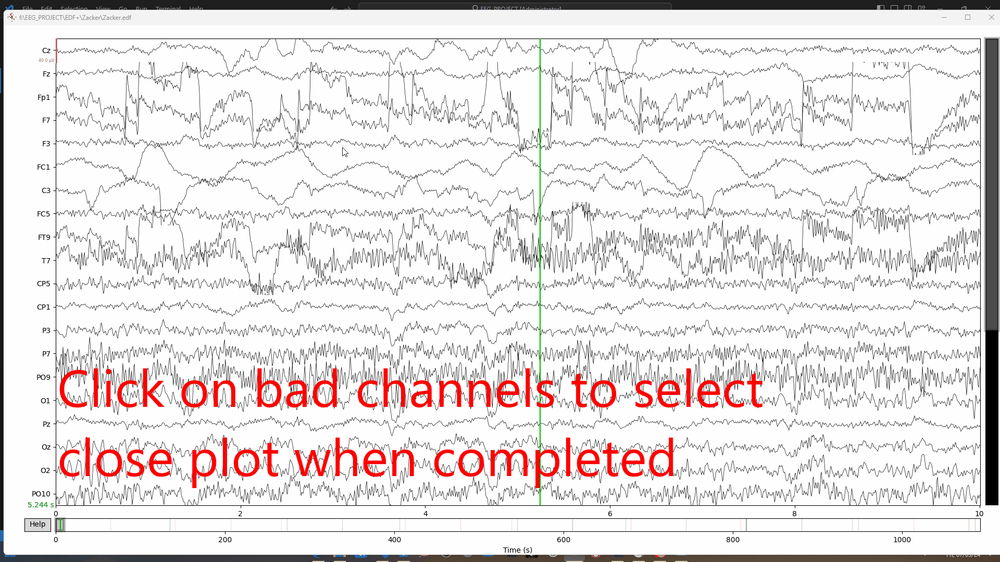

Further 'Preprocessing' / processing is possible using annotations, which we'll cover later.   Additionally, mne has many preprocessing options available, such as:

In [4]:
dir(mne.preprocessing)

['EOGRegression',
 'ICA',
 'Xdawn',
 'annotate_amplitude',
 'annotate_break',
 'annotate_movement',
 'annotate_muscle_zscore',
 'annotate_nan',
 'compute_average_dev_head_t',
 'compute_bridged_electrodes',
 'compute_current_source_density',
 'compute_fine_calibration',
 'compute_maxwell_basis',
 'compute_proj_ecg',
 'compute_proj_eog',
 'compute_proj_hfc',
 'corrmap',
 'cortical_signal_suppression',
 'create_ecg_epochs',
 'create_eog_epochs',
 'equalize_bads',
 'eyetracking',
 'find_bad_channels_lof',
 'find_bad_channels_maxwell',
 'find_ecg_events',
 'find_eog_events',
 'fix_stim_artifact',
 'get_score_funcs',
 'ica_find_ecg_events',
 'ica_find_eog_events',
 'ieeg',
 'infomax',
 'interpolate_bridged_electrodes',
 'maxwell_filter',
 'maxwell_filter_prepare_emptyroom',
 'nirs',
 'oversampled_temporal_projection',
 'peak_finder',
 'read_eog_regression',
 'read_fine_calibration',
 'read_ica',
 'read_ica_eeglab',
 'realign_raw',
 'regress_artifact',
 'write_fine_calibration']

Our favorites will probably be:
['EOGRegression',                   #This works great!
 'ICA',                             #This works great!
 'annotate_amplitude',              #This works great!
 'annotate_movement',               #We have this data, not sure how relevant it will be
 'annotate_muscle_zscore',          #This works great!
 'annotate_nan',                    # Useful for channel issues, probably not us
 'compute_bridged_electrodes',      #Useful to find bridged electrodes.  We probably don't have any
 'compute_current_source_density',  ##Will try this
 'compute_proj_ecg',                ##Will try this
 'compute_proj_eog',                ##Will try this
 'compute_proj_hfc',                ##Will try this
 'create_ecg_epochs',               #This works great!
 'create_eog_epochs',               #This works great!
 'equalize_bads',                   ##Will try this
 'find_bad_channels_lof',           ##Will try this
 'find_bad_channels_maxwell',       ##Will try this
 'find_ecg_events',                 #This works great!
 'find_eog_events',                 #This works great!
 'ica_find_ecg_events',             #This works great!
 'ica_find_eog_events',             #This works great!
 'interpolate_bridged_electrodes',  # Unlikely with saline, will double check though
 'peak_finder',                     #Will try this
 'regress_artifact',                #
]

Not using these because
[
 'Xdawn',                               #Have not explored this
 'annotate_break',                      #We don't have breaks
 'annotate_movement',                   #We have this, not sure how relevant it is
 'annotate_nan',                        #We don't have breaks
 'compute_average_dev_head_t',          #Have not explored this
 'compute_bridged_electrodes',          #Have not explored this
 'compute_current_source_density',      #Have not explored this
 'compute_fine_calibration',            #Have not explored this
 'compute_maxwell_basis',               #Other maxwell functions required empty room recordings
 'compute_proj_ecg',                    #Have not explored this
 'compute_proj_eog',                    #Have not explored this
 'compute_proj_hfc',                    #Have not explored this, most likley does not work with our data
 'corrmap',                             #Have not explored this
 'cortical_signal_suppression',         #Have not explored this
 'create_ecg_epochs',                   #This works great!
 'create_eog_epochs',                   #This works great!
 'equalize_bads',                       #Will try this
 'eyetracking',                         #Literally does not apply to our data
 'find_bad_channels_lof',               #Not sure if it applies with our data
 'find_bad_channels_maxwell',           #Not sure if it applies with our data
 'fix_stim_artifact',                   #Not sure if it applies with our data
 'get_score_funcs',                     #Not sure if it applies with our data
 'ieeg',                                #Not sure if it applies with our data
 'infomax',                             #Not sure if it applies with our data
 'interpolate_bridged_electrodes',      #Not sure if it applies with our data
 'maxwell_filter',                      #Not sure if it applies with our data
 'maxwell_filter_prepare_emptyroom',    #Literally does not apply to our data
 'nirs',                                #Literally does not apply to our data
 'oversampled_temporal_projection',     #Not sure if it applies with our data
 'read_eog_regression',                 #Advanced functionallity, need pre-req first
 'read_fine_calibration',               #Advanced functionallity, need pre-req first
 'read_ica',                            #Advanced functionallity, need pre-req first
 'read_ica_eeglab',                     #Literally does not apply to our data
 'realign_raw',                         #Not sure if it applies with our data
 'regress_artifact',                    #Have not explored this
 'write_fine_calibration']              #Advanced functionallity, need pre-req first

It would be very helpful to review https://mne.tools/stable/auto_tutorials/preprocessing/30_filtering_resampling.html#slow-drifts
and some other resources to see how to best apply filters! 

# Final Code

NOTE: Normally, you filter immediately after import.  This was just done to show the steps broken down completely. 

Extracting EDF parameters from f:\WEBSITE\EDF_analysis\EDF+\254362\254362.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 143999  =      0.000 ...  1124.992 secs...
Lets compare with and without dc removed:


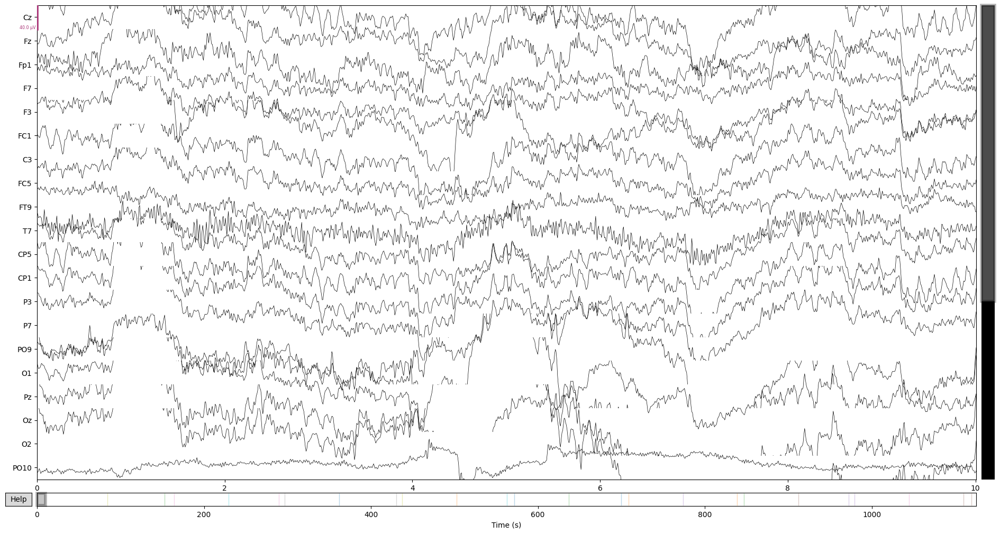

DC removed:


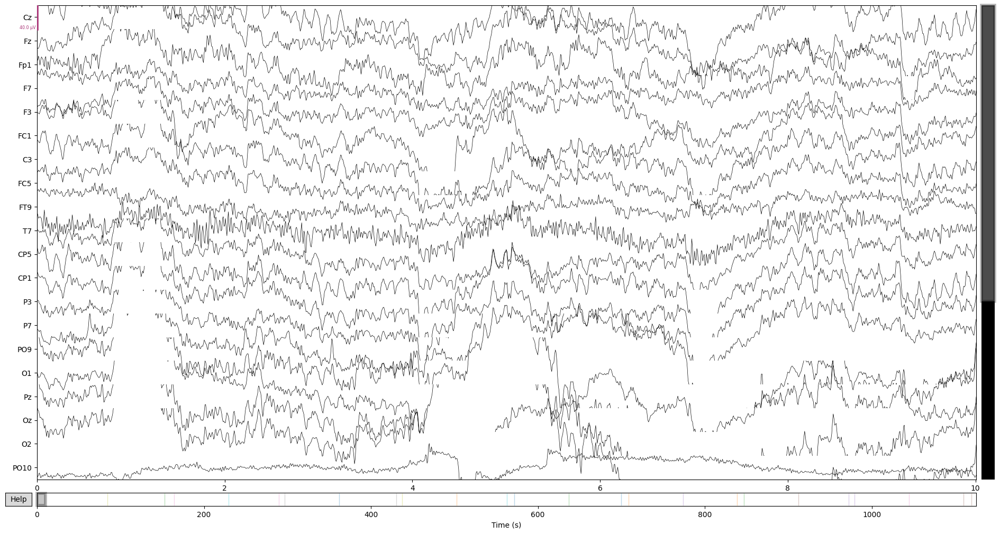

Notice that removing the DC drifts
 makes more data fit on the graph!
(depending on what is graphed)

Let's filter the raw so that we can see how much it improves the signal!
Filtering a subset of channels. The highpass and lowpass values in the measurement info will not be updated.
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 1 - 40 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Upper passband edge: 40.00 Hz
- Upper transition bandwidth: 10.00 Hz (-6 dB cutoff frequency: 45.00 Hz)
- Filter length: 423 samples (3.305 s)



[Parallel(n_jobs=4)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=4)]: Done  32 out of  32 | elapsed:    0.2s finished


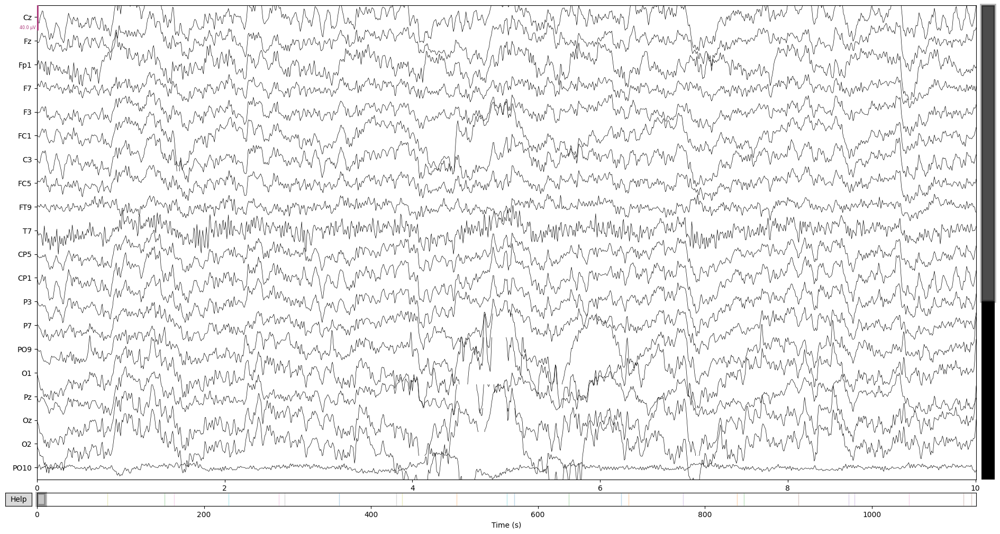

Filtering raw data in 1 contiguous segment
Setting up high-pass filter at 1 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal highpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 1.00
- Lower transition bandwidth: 1.00 Hz (-6 dB cutoff frequency: 0.50 Hz)
- Filter length: 423 samples (3.305 s)



[Parallel(n_jobs=1)]: Done  17 tasks      | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done  71 tasks      | elapsed:    0.4s


Applying ICA to Raw instance
    Transforming to ICA space (30 components)
    Zeroing out 12 ICA components
    Projecting back using 32 PCA components


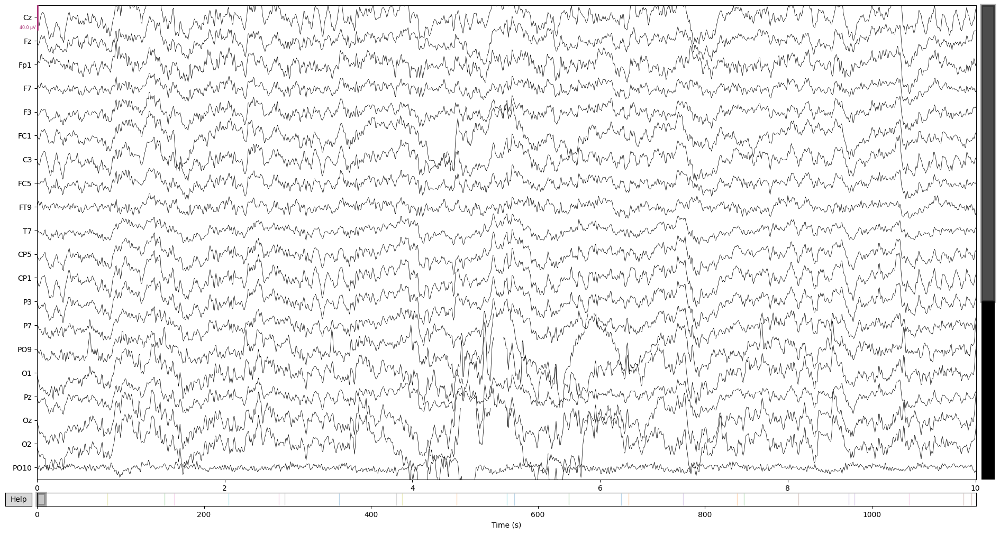

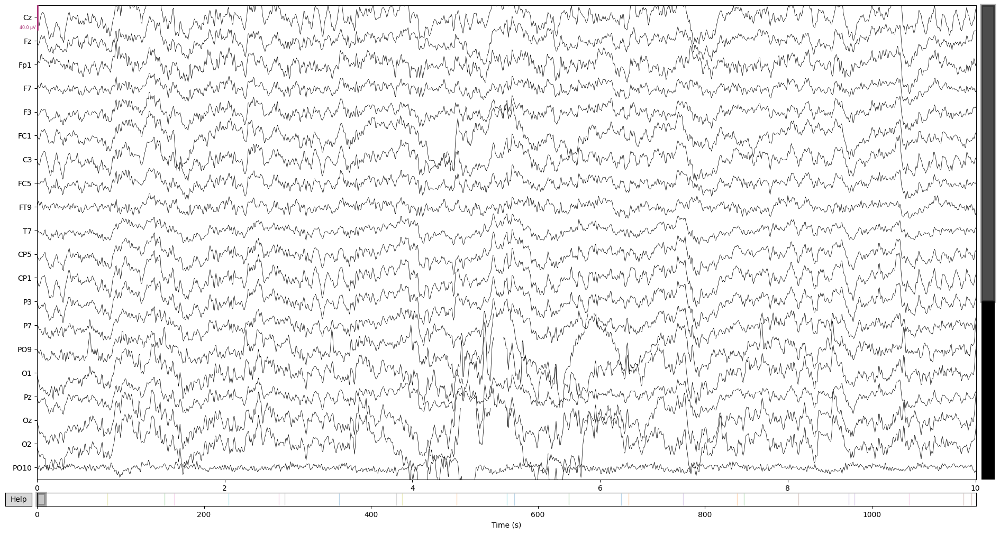

In [10]:
import mne
from mne.preprocessing import ICA  # Import it explicitly to minimize required code and refer to it more easily
muscle_threshold = 0.6 #0.5
eog_threshold = 4 #3

## Definitions:

# Define eeg channels for when we need to pass them explicitly as arguments
eeg_channels = ['Cz', 'Fz', 'Fp1', 'F7', 'F3', 'FC1', 'C3', 'FC5', 'FT9', 'T7', 'CP5', 'CP1', 'P3', 'P7', 'PO9', 'O1', 'Pz', 'Oz', 'O2', 'PO10', 'P8', 'P4', 'CP2', 'CP6', 'T8', 'FT10', 'FC6', 'C4', 'FC2', 'F4', 'F8', 'Fp2']
eog_channels=['Fp1', 'Fp2']

# Create a raw object.  A raw object is the data exactly as exported from emotiv.  It will have methods available for processing
raw = mne.io.read_raw_edf(
    r'EDF+\254362\254362.edf', # What file?
    #eog=['Fp1', 'Fp2'], # Define eog channels!  I suggest trying making a copy of these as eog1 and eog2 for a futyre experiment ##NOTE: YOU MUST watch the capitalization!
    misc=None, # List of channel names to be considered as miscellaneous (MISC) channels.
    stim_channel=None,  # Set to None if you don't have a stim channel
    # exclude=[],  # Exclude channels you don't want
    preload=True,  # Preload data into memory to speed things up
    infer_types=True,  # Infer channel types from names
    verbose=True  # Set verbosity / output messages
    )

# Here we will set attributes of the object for it to recognize electrode position from our data for plotting and location based needs
montage = mne.channels.make_standard_montage('standard_1020') #Our data is in standard 1020 format from emotiv
raw.set_montage(montage, on_missing='ignore') #Our "missing" electrodes are ones that are in the 1020 layout, but not in our 32 channels.  
raw.pick('eeg') # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want later

print('Lets compare with and without dc removed:')
raw.pick('eeg').plot(picks=eeg_channels, title = 'Raw Data',block=True, remove_dc=False) #NOTE: Please see all options in documentation, ommited here to keep it simple!  Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
print('DC removed:')
raw.pick('eeg').plot(picks=eeg_channels, title = 'Raw Data',block=True, remove_dc=True)
print('Notice that removing the DC drifts\n makes more data fit on the graph!\n(depending on what is graphed)\n')
## OPTIONAL: Plot original raw again for re-comparison
    # raw.pick('eeg').plot(picks=eeg_channels, title = 'Raw Data',block=True) # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want
print("Let's filter the raw so that we can see how much it improves the signal!")

#Filtering options
filtered = raw.copy().filter(
            l_freq=1, #NOTE: This is a key value to experiment with!
            h_freq=40, #The high frequency cut off
            picks=eeg_channels, #Explicitly pass the channels so it doesn't try and filter contact quality, for example
            n_jobs = 4, #The more, the faster the processing            
            ) # Apply bandpass filter

filtered.pick('eeg').plot(picks=eeg_channels, title = 'Filtered Data',block=True) # Pick only eeg related data!  However, we still have more data then we need!  We'll plot only the channels we want

ica = ICA(
    # n_components=32, # Some warnings indicate we need to use less than 31, or a float of 0.9999
    n_components=30, # Some warnings indicate we need to use less than 31, or a float of 0.9999
    #noise_cov =  # This is handled automatically by default
    #method = # This is handled automatically by default
    # fit_params = # This is handled automatically by default
    random_state=97,
    # max_iter=1200, # This is auto by default
    max_iter="auto", #This is the default
    )

# Apply high-pass filter to filtered data explicitly
filtered.filter(l_freq=1.0, h_freq=None)

ica.fit(
    inst = filtered,
    picks = eeg_channels,
    # start =,
    # stop =,
    # decim =, #NOTE: Experiment with this!
    # reject =,
    # flat =, #NOTE: This is usually used for auto reject, or defining bad data more, but, please experiment with in future
    tstep = 2,# 2 by default NOTE: Experiment with this 
    # reject_by_annotation = True,
    verbose = False,
    )



# Find EOG artifacts
eog_indices, eog_scores = ica.find_bads_eog(
    inst = filtered, # the instance to perform the analysis on
    ch_name=eog_channels, #Tell it the channels most affected by blinks, which can be substituted for eog channels
    threshold = eog_threshold, #Default is 3, edit this as needed
    measure = "zscore", #zscore is default, see documentation for options
    verbose = False
    )  # Define EOG indicies and scores

# Find muscle artifacts
muscle_noise_indices, muscle_noise_scores = ica.find_bads_muscle(
    inst= filtered, # Work with the filtered data
    threshold = muscle_threshold,
    # start: Any | None = None,
    # stop: Any | None = None,
    # l_freq: int = 7,
    # h_freq: int = 45,
    # sphere: Any | None = None,
    verbose= False
    )

# Exclude the identified artifact components
ica.exclude = list(set(eog_indices + muscle_noise_indices))

# Apply ICA to the raw data
filtered_clean = ica.apply(filtered.copy())# Leave the original unchanged, for later comparison.  Often we don't mind modifying the original
# raw #Block must be True if working interactively with a .py file.  Also, we are picking only eeg channels
filtered_clean.pick('eeg').plot(picks=eeg_channels, title = 'Filtered Data',block=True)